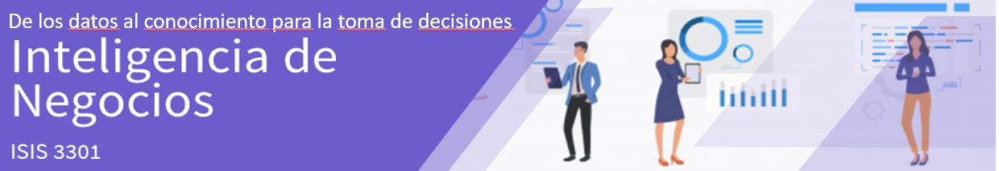

# Exploración y análisis de calidad de datos
En este cuaderno revisaremos dos aspectos importantes para entender un archivo y responder a necesidades de una empresa:
* Exploración y Perfilamiento de Datos
    * Carga
    * Manipulación Básica
    * Visualización
    * Resumenes automáticos

* Calidad y limpieza de Datos:
  * Completitud
  * Duplicados
  * Estandarización
    
Para la limpieza de los datos utilizaremos la libreria de **Pandas** (https://pandas.pydata.org/) y para la visualización de los datos, usaremos: **Seaborn**(https://seaborn.pydata.org/) y **Matplotlib** (https://matplotlib.org/).

## Los Datos
Trabajaremos con una base de datos de canciones de Spotify. La base de datos original contiene alrededor de 600K canciones con diferentes caracteristicas musicales. Trabajaremos con una versión alterada de esta base de datos, ṕrecisamente para recalcar las competencias que se quieren adquirir. Esta versión incluye nuevas columnas que fueron creadas por un grupo de analistas de la empresa.

La base de datos original, la pueden encontrar aquí: *https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks*

# Exploración y perfilamiento de Datos

## 1. Carga

### 1.1 Librerias
En caso de no tener instaladas las librerias, recuerde que lo puede hacer desde la interfaz de Anaconda o directamente desde el cuaderno usando alguno de los siguientes comandos:

Si está usando Anaconda
```python
import sys
!conda install --yes --prefix {sys.prefix} pandas
```

Si está usando Pip
```python
import sys
!{sys.executable} -m pip install numpy
```

In [1]:
# Librerias generales
# Pandas
import pandas as pd
pd.set_option('display.max_columns', 25) # Número máximo de columnas a mostrar
pd.set_option('display.max_rows', 50) # Numero máximo de filas a mostar
# Ranom seed
import numpy as np
np.random.seed(3301)

# Seaborn
import seaborn as sns 

# Matplolib
%matplotlib inline
import matplotlib.pyplot as plt


In [2]:
# Ubicacion de la base de datos
db_location = "data/PrepTracks.csv"

In [3]:
# Leer los datos
df_tracks = pd.read_csv(db_location)

FileNotFoundError: [Errno 2] No such file or directory: 'data/PrepTracks.csv'

In [ ]:
# Dimensiones de los datos
df_tracks.shape

In [ ]:
# Ver los datos
display(df_tracks.sample(5)) # Muestra
#display(df_tracks.head(5)) # Primeras Filas
#display(df_tracks.tail(5)) # Ultimas Filas

## 2. Descripción de los datos

In [ ]:
# Imprimimos los diferentes tipos de las columnas
df_tracks.dtypes

#### 2.1 Datos Numéricos

In [ ]:
# Seleccionar las columnas numericas
# Error: para comparar arreglos entrada a entrada hay que usar | y &
#number_cols = df_tracks.dtypes[df_tracks.dtypes == np.int64 or df_tracks.dtypes == np.float64].index
number_cols = df_tracks.dtypes[(df_tracks.dtypes == np.int64) | (df_tracks.dtypes == np.float64)].index
number_cols = df_tracks.select_dtypes(include = ['int','float']).columns
number_cols

In [ ]:
# Resumen
df_tracks[number_cols].describe()

¿Qué podemos decir con esta información que podemos decir de los datos?

In [ ]:
# Resumenes individuales
df_tracks['duration_ms'].describe() #Opción 1


In [ ]:
# Resumenes individuales
df_tracks.duration_ms.mean() #Opción 2
df_tracks.duration_ms.sum()
df_tracks.duration_ms.std()

In [ ]:
# Operaciones entre vectores
# Nueva columna que significa la energia por ms
# Error: no se pueden crear atributos llamandolos como propiedades
#df_tracks.energy_by_ms = df_tracks.energy / df_tracks.duration_ms
df_tracks['energy_by_ms'] = df_tracks.energy / df_tracks.duration_ms

df_tracks[['name','energy_by_ms']]

**Ejercicio**
Revise los resumenes de las variables, ¿Hay alguna columna que le parezca que no sea numérica ordinal sino tal vez categórica?
 

#### 2.2 Categóricos

In [ ]:
# Revisamos los valores de la variable categorica: mode
df_tracks['mode'].value_counts()

#### 2.3 Datos de Fechas

In [4]:
# la columna release_date deberia ser fecha pero es String
df_tracks.release_date.tail(10)

NameError: name 'df_tracks' is not defined

## 3. Visualización de Datos
Para la visualización, se puede utilizar tanto Matplotlib como Seaborn 

Nos concentraremos en los datos de los mejores 20 artistas para facilitar la visualizacion

In [34]:
# Extraemos los artistas mas populares
top = 20
df_top = df_tracks[['first_artist','popularity']].groupby('first_artist').sum().sort_values('popularity',ascending = False).head(20)
df_top

,popularity
first_artist,
Queen,5016.0
Lata Mangeshkar,4915.0
Johann Sebastian Bach,4627.0
Taylor Swift,4345.0
S. P. Balasubrahmanyam,4172.0
The Beatles,4019.0
Fünf Freunde,3840.0
The Rolling Stones,3672.0
Wolfgang Amadeus Mozart,3478.0


### 1.1 Diagramas de Temporales

In [35]:
df_plot = df_tracks[df_tracks.first_artist.isin(df_top.index)]
df_plot.shape

(2842, 26)

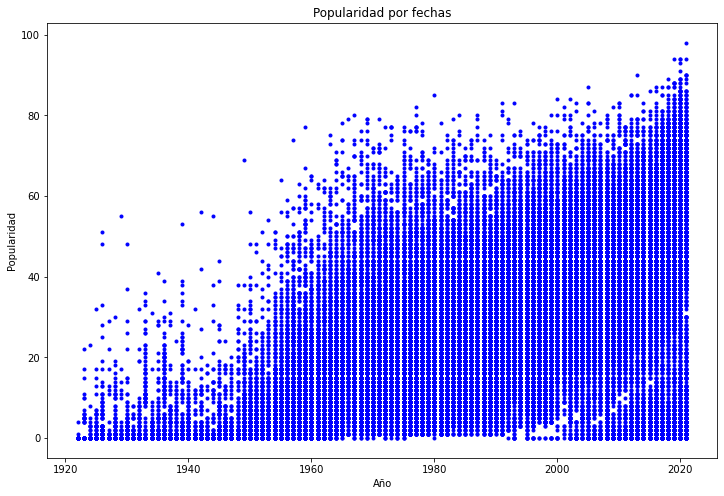

In [41]:
# Matplotlib
plt.figure(figsize=(12,8))
plt.plot(df_tracks['release_year'],df_tracks['popularity'],'.', color='blue')
plt.title('Popularidad por fechas')
plt.xlabel('Año')  
plt.ylabel('Popularidad')  
plt.show()

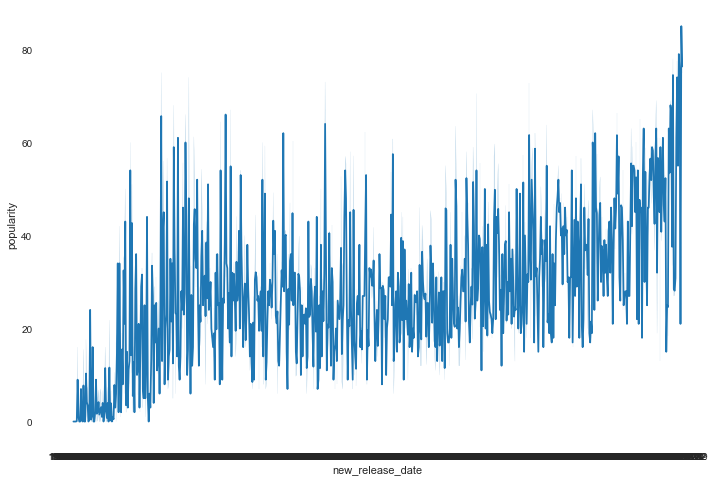

In [58]:
# Otra librería que podemos utilizar para graficar es seaborn.  
# import seaborn as sns
fig=plt.figure(figsize=(12,8))
sns.lineplot(data = df_plot, x = 'new_release_date', y = 'popularity')

### 1.2 BoxPlots

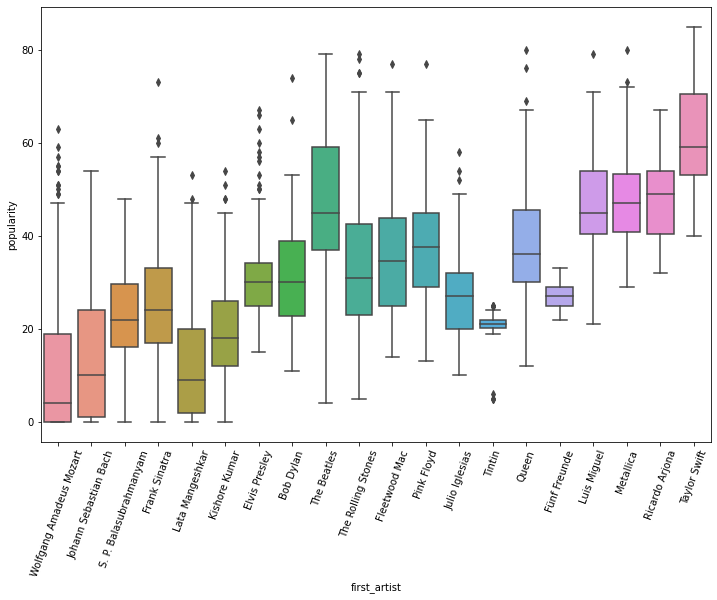

In [43]:
fig=plt.figure(figsize=(12,8))
ax = sns.boxplot(x="first_artist", y="popularity", data=df_plot)
d = ax.set_xticklabels(ax.get_xticklabels(),rotation = 70)

### 1.3 Histogramas

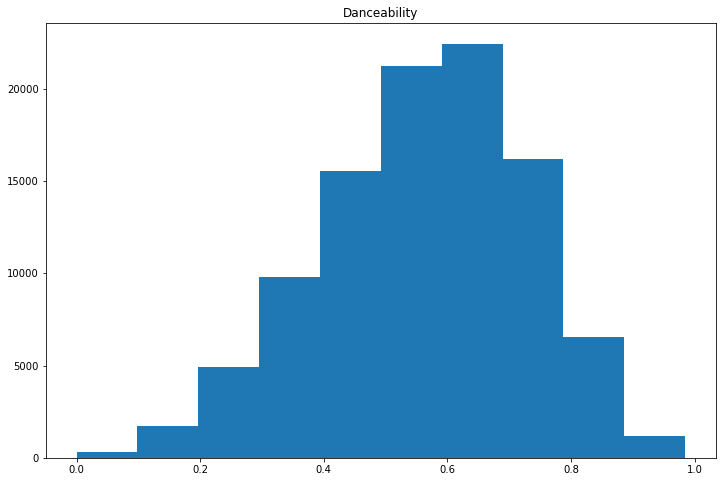

In [46]:
plt.figure(figsize=(12,8))
plt.hist(df_tracks['danceability'], bins=10)
plt.title('Danceability')  
plt.show()

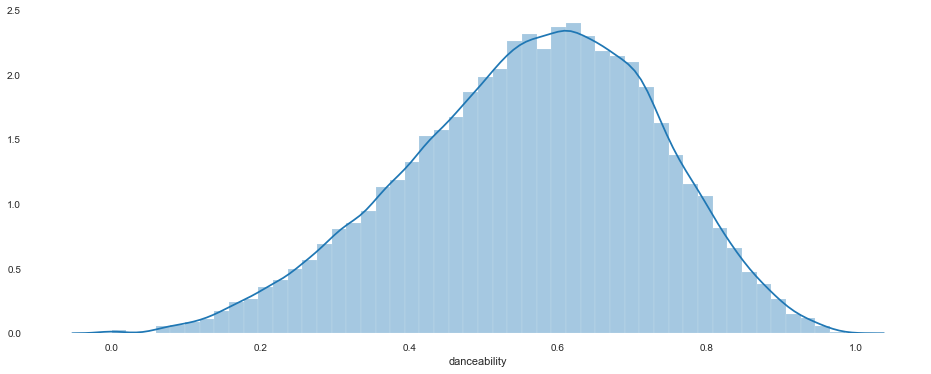

In [50]:
plt.figure(figsize=(16,6))
plt.tight_layout()
sns.distplot(df_tracks['danceability'])

### 1.4 ScatterPlots

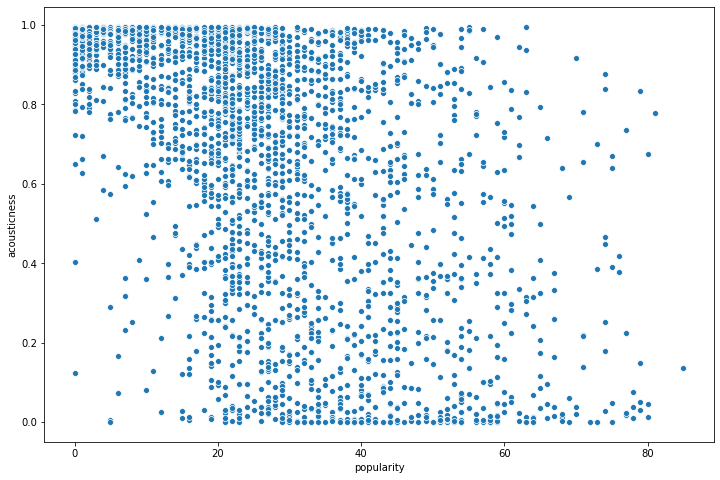

In [47]:
fig=plt.figure(figsize=(12,8))
sns.scatterplot(data=df_plot, x="popularity", y='acousticness')

Al final del dia seaborn está construido sobre matplotlib, por lo que esta última siempre va a ser más poderosa. Si necesitan algo rápido: seaborn, algo muy especifico: matplotib.

## 2. Reportes Automáticos

Para los reportes automaticos, se puede usar al herramienta de pandas profiling.


Para cada columna, genera las siguientes estadísticas, si son relevantes para el tipo de columna, se presentan en un informe HTML interactivo:

1. Inferencia de tipo: detecta los tipos de columnas en un dataframe.
2. Esenciales: tipo, valores únicos, valores faltantes.
3. Estadísticas de cuantiles como valor mínimo, Q1, mediana, Q3, máximo, rango, rango intercuartílico. Esta opción es bastante útil para identificar datos atípicos.
4. Estadísticas descriptivas como media, moda, desviación estándar, suma, desviación absoluta mediana, coeficiente de variación, curtosis, asimetría.
5. Valores más frecuentes.
6. Histogramas.
7. Correlaciones destacando variables altamente correlacionadas, matrices de Spearman, Pearson y Kendall. Esto permite descubrir relaciones entre atributos.
8. Matriz de valores faltantes, recuento, mapa de calor y dendrograma de valores faltantes

Tomado de la librería oficial de pandas_profiling en [github](https://github.com/pandas-profiling/pandas-profiling)

Lo más importante al utilizar esta librería es recordar que lo fundamental son los análisis que hagamos sobre estos reportes.

In [48]:
import pandas_profiling

profiling =pandas_profiling.ProfileReport(df_tracks)
profiling

In [49]:
profiling.to_file("spotify_db_profile.html")

# Calidad de Datos

## 1. Completitud

In [22]:
# Ver el porcentaje de atributos vacios
df_porcentajes = (100*df_tracks.isna().sum()/len(df_tracks)).to_frame()
df_porcentajes.sort_values(0, ascending = False)

,0
decibel_range,99.828161
second_artist,81.682399
name,0.108696
instrumentalness,0.103244
id,0.100781
energy,0.099902
energy_by_ms,0.099902
valence,0.098847
loudness,0.098319
speechiness,0.097440


## 2. Duplicados

In [57]:
num_duplicated = df_tracks.duplicated(subset = "id").sum()
print(f"{id}: {num_duplicated}")

<built-in function id>: 110
